# COVID-19 Forecasting and Analysis

## Introduction

As of August 2020, COVID-19 pandemic has claimed over 760,000 lives across the world and over 13 million people have been infected. Understanding the factors and policies that influence the spread of the virus can help governments make informed decisions in order to control infections and deaths until a vaccine is being developed.

The goal of this article is to answer the following questions:

- **What are the factors and policies that have the greatest impact on the number of cases and deaths across the world?**
- **How can we predict the number of COVID-19 cases and deaths in the future?**

## Import Libraries

In [1]:
!pip install plotly yellowbrick joblib seaborn orca keras xgboost pycountry geopy tpot pyprind

In [2]:
import numpy as np
import math
import pandas as pd
from collections import defaultdict
from functools import reduce
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import plotly.express as px
from matplotlib.cm import get_cmap
import plotly.offline as pyo
pyo.init_notebook_mode()
import pycountry
import pyprind
from pycountry import countries
from geopy.geocoders import Nominatim
from datetime import datetime
from yellowbrick.regressor import ResidualsPlot
from joblib import load, dump
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

/Users/amol/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.



## Read Data

In [3]:
covid_19_data = pd.read_csv('./data/covid_19_data.csv')
confirmed_cases = pd.read_csv('./data/time_series_covid_19_confirmed.csv')
deaths = pd.read_csv('./data/time_series_covid_19_deaths.csv')
recovered = pd.read_csv('./data/time_series_covid_19_recovered.csv')
confirmed_cases_us = pd.read_csv('./data/time_series_covid_19_confirmed_US.csv')
owid_covid_data = pd.read_csv('./data/owid-covid-data.csv')


mobility_data = defaultdict()

mobility_data['visitors_grocery_stores'] = pd.read_csv('./data/change-visitors-grocery-stores.csv')
mobility_data['visitors_parks_covid'] = pd.read_csv('./data/change-visitors-parks-covid.csv')
mobility_data['visitors_retail'] = pd.read_csv('./data/change-visitors-retail-recreation.csv')
mobility_data['residential_duration'] = pd.read_csv('./data/changes-residential-duration-covid.csv')
mobility_data['changes_visitors'] = pd.read_csv('./data/changes-visitors-covid.csv')


policy_data = defaultdict()

policy_data['public_events_policies'] = pd.read_csv('./data/public-events-covid.csv')
policy_data['public_gathering_policies'] = pd.read_csv('./data/public-gathering-rules-covid.csv')
policy_data['public_information_campaigns'] = pd.read_csv('./data/public-campaigns-covid.csv')
policy_data['public_transport_policies'] = pd.read_csv('./data/public-transport-covid.csv')
policy_data['school_closures'] = pd.read_csv('./data/school-closures-covid.csv')
policy_data['work_closures'] = pd.read_csv('./data/workplace-closures-covid.csv')
policy_data['stay_at_home_policies'] = pd.read_csv('./data/stay-at-home-covid.csv')
policy_data['contract_tracing'] = pd.read_csv('./data/covid-contact-tracing.csv')
policy_data['debt_relief'] = pd.read_csv('./data/debt-relief-covid.csv')
policy_data['income_support'] = pd.read_csv('./data/income-support-covid.csv')
policy_data['internal_movement'] = pd.read_csv('./data/internal-movement-covid.csv')
policy_data['international_travel'] = pd.read_csv('./data/international-travel-covid.csv')
policy_data['testing_policy'] = pd.read_csv('./data/covid-19-testing-policy.csv')

## Preprocessing Data

### Merging Policy Data and Mobility Data

In [4]:
def get_merged_data(data_dict):
    
    dataframes = list(data_dict.values())
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Entity', 'Code', 'Date'],
                                            how='inner'), dataframes)
    
    return df_merged

def merge_dataframes(dfs, merge_cols):
    
    
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=merge_cols,
                                            how='inner'), dfs)
    
    return df_merged

In [5]:
merged_policy_data = get_merged_data(policy_data)
merged_policy_data['Date'] = pd.to_datetime(merged_policy_data['Date'])
merged_policy_data.rename(columns={'Entity': 'Country/Region'}, inplace=True)
merged_policy_data.head(10)

,Country/Region,Code,Date,Cancel public events (OxBSG),Restrictions on gatherings (OxBSG),Public information campaigns (OxBSG),Close public transport (OxBSG),School closures,Workplace Closures (OxBSG),Stay at home requirements (OxBSG),Contact tracing (OxBSG),Debt or contract relief,Income support,Restrictions on internal movement (OxBSG),International travel controls (OxBSG),Testing policy (OxBSG)
0,Afghanistan,AFG,2020-01-01,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Afghanistan,AFG,2020-01-02,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Afghanistan,AFG,2020-01-03,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Afghanistan,AFG,2020-01-04,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Afghanistan,AFG,2020-01-05,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Afghanistan,AFG,2020-01-06,0,0,0,0,0,0,0,0,0,0,0,0,0
6,Afghanistan,AFG,2020-01-07,0,0,0,0,0,0,0,0,0,0,0,0,0
7,Afghanistan,AFG,2020-01-08,0,0,0,0,0,0,0,0,0,0,0,0,0
8,Afghanistan,AFG,2020-01-09,0,0,0,0,0,0,0,0,0,0,0,0,0
9,Afghanistan,AFG,2020-01-10,0,0,0,0,0,0,0,0,0,0,0,0,0


In [6]:
merged_policy_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40975 entries, 0 to 40974
Data columns (total 16 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   Country/Region                             40975 non-null  object        
 1   Code                                       40975 non-null  object        
 2   Date                                       40975 non-null  datetime64[ns]
 3   Cancel public events (OxBSG)               40975 non-null  int64         
 4   Restrictions on gatherings (OxBSG)         40975 non-null  int64         
 5   Public information campaigns (OxBSG)       40975 non-null  int64         
 6   Close public transport (OxBSG)             40975 non-null  int64         
 7   School closures                            40975 non-null  int64         
 8   Workplace Closures (OxBSG)                 40975 non-null  int64         
 9   Stay at home requ

In [7]:
merged_mobility_data = get_merged_data(mobility_data)
merged_mobility_data['Date'] = pd.to_datetime(merged_mobility_data['Date'])
merged_mobility_data.rename(columns={'Entity': 'Country/Region'}, inplace=True)
merged_mobility_data.head(10)

,Country/Region,Code,Date,Grocery & Pharmacy Stores (%)_x,Parks (%)_x,Retail & Recreation (%)_x,Residential (%)_x,Retail & Recreation (%)_y,Grocery & Pharmacy Stores (%)_y,Residential (%)_y,Transit Stations (%),Parks (%)_y,Workplaces (%)
0,Afghanistan,AFG,2020-02-17,4.000,1.000,0.000,1.333,0.000,4.000,1.333,5.667,1.000,-6.333
1,Afghanistan,AFG,2020-02-18,4.250,1.500,0.750,0.750,0.750,4.250,0.750,6.500,1.500,-3.250
2,Afghanistan,AFG,2020-02-19,4.000,1.400,0.400,0.800,0.400,4.000,0.800,5.200,1.400,-1.600
3,Afghanistan,AFG,2020-02-20,3.833,1.000,0.000,0.833,0.000,3.833,0.833,5.000,1.000,-0.333
4,Afghanistan,AFG,2020-02-21,4.571,1.429,0.000,0.714,0.000,4.571,0.714,5.286,1.429,0.571
5,Afghanistan,AFG,2020-02-22,6.714,2.286,1.571,0.000,1.571,6.714,0.000,6.571,2.286,5.429
6,Afghanistan,AFG,2020-02-23,6.000,2.429,1.429,0.143,1.429,6.000,0.143,6.143,2.429,5.714
7,Afghanistan,AFG,2020-02-24,6.286,2.714,1.000,0.286,1.000,6.286,0.286,6.143,2.714,6.000
8,Afghanistan,AFG,2020-02-25,6.286,2.429,0.857,0.429,0.857,6.286,0.429,6.143,2.429,6.143
9,Afghanistan,AFG,2020-02-26,6.571,2.571,0.857,0.429,0.857,6.571,0.429,6.571,2.571,6.143


In [8]:
merged_policy_data = pd.merge(merged_policy_data, merged_mobility_data,
                              how='left', 
                              left_on=['Country/Region','Code','Date'], 
                              right_on = ['Country/Region','Code','Date']).fillna(0)

### Transforming Case, Deaths, and Recovered Stats

In [9]:
def group_stats_by_country(df):
    
    cols = list(df.columns[4:])
    country_stats = df.groupby('Country/Region').sum()
    countries = list(country_stats.index)
    
    country_stats['Country/Region'] = countries
        
    #return country_stats.drop(['Lat', 'Long'], axis=1)
    return country_stats

In [10]:
case_stats = group_stats_by_country(confirmed_cases)
deaths_stats = group_stats_by_country(deaths)
recovered_stats = group_stats_by_country(recovered)

In [11]:
def add_date_column(df, metric_name='confirmed_cases'):
    
    data_dict = defaultdict()
    data_dict['Country/Region'] = []
    data_dict['Date'] = []
    data_dict[metric_name] = []
    
    date_cols = list(filter((lambda x: x.count('/') == 2), list(df.columns)))
    n = len(date_cols)
    
    for index, row in df.iterrows():
        country = [row['Country/Region']] * n
        metric_values = list(row[date_cols])
        
        data_dict['Country/Region'] = data_dict['Country/Region'] + country
        data_dict['Date'] = data_dict['Date'] + date_cols
        data_dict[metric_name] = data_dict[metric_name] + metric_values
        
        
    return pd.DataFrame(data_dict)
        

In [12]:
case_stats_by_date = add_date_column(case_stats, metric_name='confirmed_cases')
deaths_stats_by_date = add_date_column(deaths_stats, metric_name='deaths')
recovered_stats_by_date = add_date_column(recovered_stats, metric_name='recovered')

In [13]:
dataframes = [case_stats_by_date, deaths_stats_by_date, recovered_stats_by_date]
all_stats_by_date = merge_dataframes(dataframes, merge_cols=['Country/Region', 'Date'])
all_stats_by_date['Date'] = pd.to_datetime(all_stats_by_date['Date'])
all_stats_by_date

,Country/Region,Date,confirmed_cases,deaths,recovered
0,Afghanistan,2020-01-22,0,0,0
1,Afghanistan,2020-01-23,0,0,0
2,Afghanistan,2020-01-24,0,0,0
3,Afghanistan,2020-01-25,0,0,0
4,Afghanistan,2020-01-26,0,0,0
...,...,...,...,...,...
40227,Zimbabwe,2020-08-18,5378,141,4105
40228,Zimbabwe,2020-08-19,5643,150,4442
40229,Zimbabwe,2020-08-20,5745,151,4525
40230,Zimbabwe,2020-08-21,5815,152,4587


### Generating Country Codes

In [14]:
code_dict = defaultdict()

def get_country_code(country):
    
    exceptions = {'laos': 'LAO', 
                  'burma': 'MMR', 
                  'congo (brazzaville)': 'COG', 
                  'congo (kinshasa)': 'COD',
                  'korea, south': 'KOR',
                  'diamond princess': 'DMD_PRCS',
                  'ms zaandam': 'MS_ZAND',
                  'taiwan*': 'TWN',
                  'west bank and gaza': 'PSE'}
    
    try:
        try:
            return code_dict[country]
        except:   
            code = countries.search_fuzzy(country)[0].alpha_3
            code_dict[country] = code
            return code
    except:
        if type(country) == float:
            return country
        else:
            code = exceptions[country.lower()]
            code_dict[country] = code
            return code


In [15]:
policy_countries = list(merged_policy_data['Country/Region'].unique())

In [16]:
all_stats_by_date['Code'] = all_stats_by_date['Country/Region'].map(get_country_code)

### Getting Accurate Latitude and Longitude Coordinates

In [17]:
geolocator = Nominatim(user_agent="forecasting_app")
countries = list(all_stats_by_date['Country/Region'].unique())

def create_coordinate_dict(countries):
    
    location_dict = defaultdict()
    for country in countries:
        location = geolocator.geocode(country)
        location_dict[country] = {'latitude': location.latitude, 'longitude': location.longitude}
    
    return location_dict

def get_latitude(country, location_dict):
    
    return location_dict[country]['latitude']

def get_longitude(country, location_dict):
    
    return location_dict[country]['longitude']

location_dict = create_coordinate_dict(countries)

all_stats_by_date['Lat'] = all_stats_by_date['Country/Region'].map(lambda x: get_latitude(x, location_dict))
all_stats_by_date['Long'] = all_stats_by_date['Country/Region'].map(lambda x: get_longitude(x, location_dict))

### Merging Policy Data and Cases, Deaths, and Recovery Statistics

In [18]:
factor_data_by_date = merge_dataframes([all_stats_by_date, merged_policy_data], merge_cols=['Code', 'Date'])
factor_data_by_date.drop('Country/Region_y', axis=1, inplace=True)
factor_data_by_date.rename(columns={'Country/Region_x': 'Country/Region'}, inplace=True)
factor_data_by_date.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35020 entries, 0 to 35019
Data columns (total 31 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   Country/Region                             35020 non-null  object        
 1   Date                                       35020 non-null  datetime64[ns]
 2   confirmed_cases                            35020 non-null  int64         
 3   deaths                                     35020 non-null  int64         
 4   recovered                                  35020 non-null  int64         
 5   Code                                       35020 non-null  object        
 6   Lat                                        35020 non-null  float64       
 7   Long                                       35020 non-null  float64       
 8   Cancel public events (OxBSG)               35020 non-null  int64         
 9   Restrictions on g

### Adding Additional Fields

In [19]:
owid_covid_data['date'] = pd.to_datetime(owid_covid_data['date'])

In [20]:
all_data_by_date = pd.merge(factor_data_by_date, owid_covid_data,
         how='left', 
         left_on=['Code','Date'], 
         right_on = ['iso_code','date'])

### Computing Differences

In [21]:
def compute_diffs(df, split_col='Code', fields=['confirmed_cases', 'deaths', 'recovered']):
    
    data_dict = defaultdict()
    codes = (df[split_col].unique())
    
    for code in codes:
        df_code = df[df[split_col] == code]
        
        for field in fields:
            df_code[field + '_diff'] = np.diff(df_code[field], prepend = 0)
        
        data_dict[code] = df_code
    
    return pd.concat(list(data_dict.values()))

In [22]:
all_data_by_date_diffs = compute_diffs(all_data_by_date)

## Exploratory Data Analysis and Visualizations

### Comparing Case Trajectories Across Different Countries

In [23]:
from datetime import datetime
dates = confirmed_cases.columns[4:].map(lambda date: datetime.strptime(date, '%m/%d/%y'))

In [24]:
from matplotlib.colors import hsv_to_rgb
from cycler import cycler

# 1000 distinct colors:
colors = [hsv_to_rgb([(i * 0.618033988749895) % 1.0, 1, 1])
          for i in range(1000)]
plt.rc('axes', prop_cycle=(cycler('color', colors)))

In [25]:
def plot_cases(countries):
    
    for country in countries:
        plt.plot(dates, 
                 confirmed_cases[confirmed_cases['Country/Region'] == country].values[:, 4:].reshape(-1, 1),
                label=country)
        plt.legend(loc='best')
    
    plt.show() 

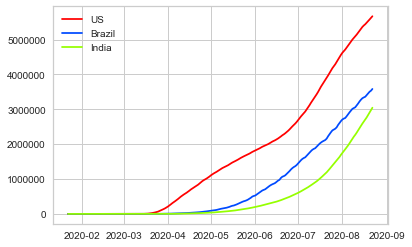

In [26]:
countries = ['US', 'Brazil', 'India']
plot_cases(countries)

### Visualizing Case Counts on a Map

In [27]:
fig = px.choropleth(case_stats_by_date, 
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "blues",
                    color = 'confirmed_cases',
                    title='COVID-19 Cases')

fig.show()
#fig.show("svg")
#fig.write_image('./visualizations/confirmed_cases.svg')

### Distribution of Case Counts and Changes in Case Counts

In [28]:
daily_data = all_data_by_date_diffs[all_data_by_date_diffs['Date'] == datetime(2020, 7, 20)]

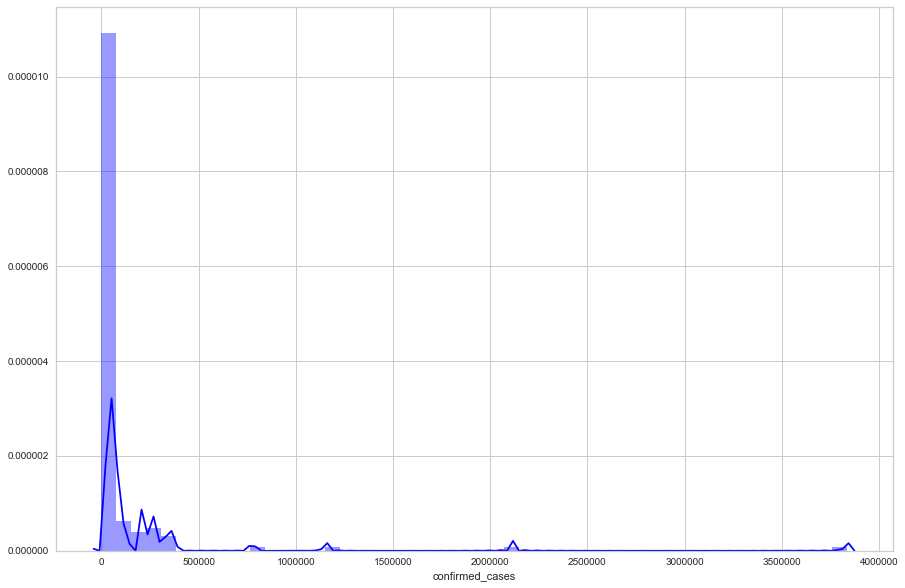

In [29]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.distplot(daily_data['confirmed_cases'], ax=ax, color='blue')

### Visualizing Deaths on a Map

In [30]:
fig = px.choropleth(deaths_stats_by_date,
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "reds",
                    color = 'deaths',
                    title='COVID-19 Deaths')

fig.show()
#fig.show("svg")
#fig.write_image('./visualizations/deaths.svg')

### Visualizing Daily Deaths and Changes in Deaths

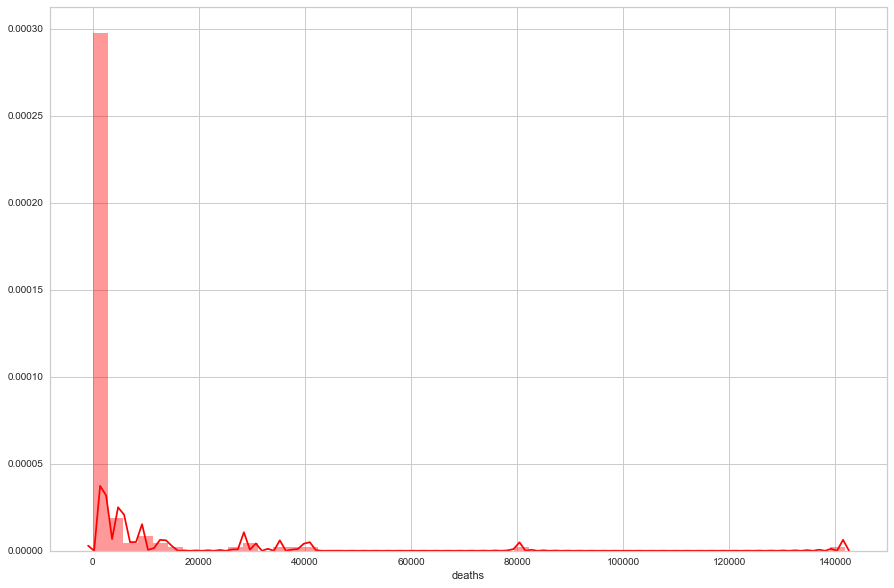

In [31]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.distplot(daily_data['deaths'], ax=ax, color='red')

### Visualizing Recovered Cases on a Map

In [32]:
fig = px.choropleth(recovered_stats_by_date,
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "greens",
                    color = 'recovered',
                    title='COVID-19 Recovered Cases')

fig.show()
#fig.show("svg")
#fig.write_image('./visualizations/recovered.svg')

### Confirmed Cases, Deaths, and Recoveries

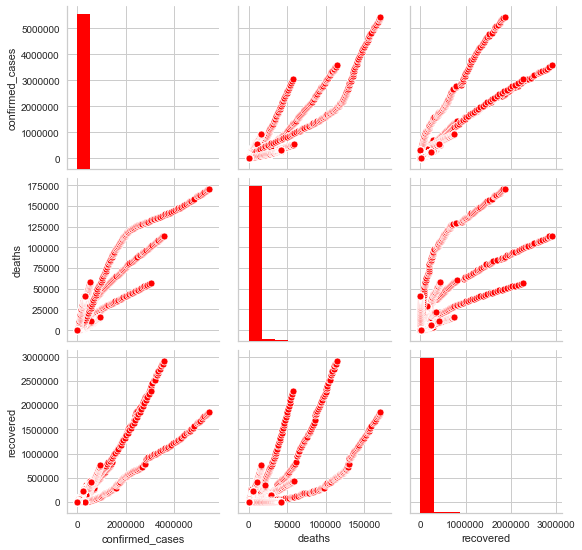

In [33]:
sns.pairplot(all_data_by_date[['confirmed_cases','deaths', 'recovered']])

### Visualizing Policy Changes Around the World

In [34]:
merged_policy_data['Date_string'] = merged_policy_data['Date'].map(lambda x: str(x))

In [35]:
fig = px.choropleth(merged_policy_data,
                    animation_frame = 'Date_string',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "greens",
                    color = 'Cancel public events (OxBSG)',
                    range_color=(0, 2),
                    title='Cancellation of Public Events')

fig.show()

### Looking at Case Differences

In [36]:
def plot_columns(data, country, columns):
    
    country_data = data[data['Country/Region'] == country]
    plt.figure(figsize=(15, 10))
    for column in columns:
        plt.plot(country_data['Date'], country_data[column], label=column)
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.legend(loc='best')
    plt.title('Trends for {}'.format(country))
    plt.show()
    
def filter_by_country(data, country):
    
    return data[data['Country/Region'] == country]

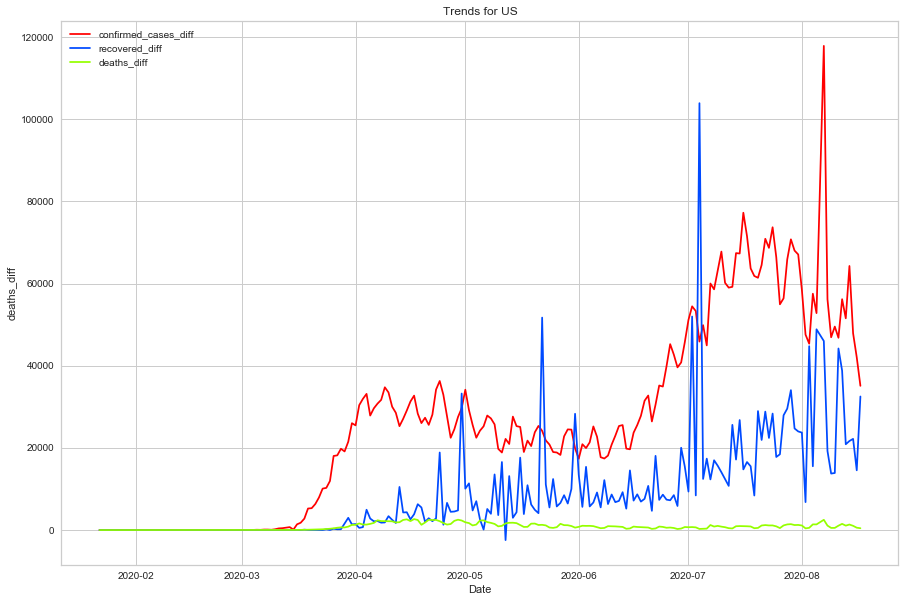

In [37]:
plot_columns(all_data_by_date_diffs, 
            'US', 
            columns=['confirmed_cases_diff',
                     'recovered_diff',
                     'deaths_diff'])

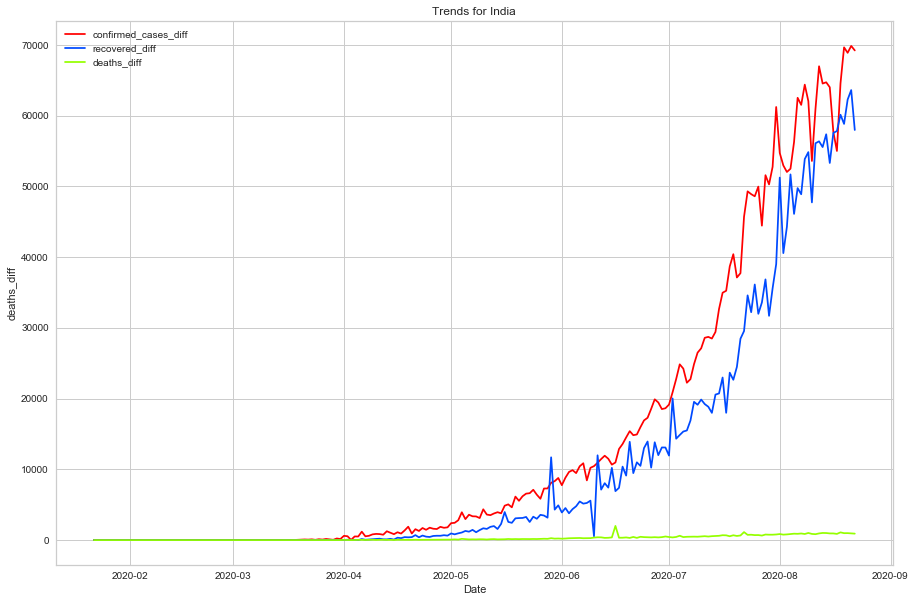

In [38]:
plot_columns(all_data_by_date_diffs, 
            'India', 
            columns=['confirmed_cases_diff',
                     'recovered_diff',
                     'deaths_diff'])

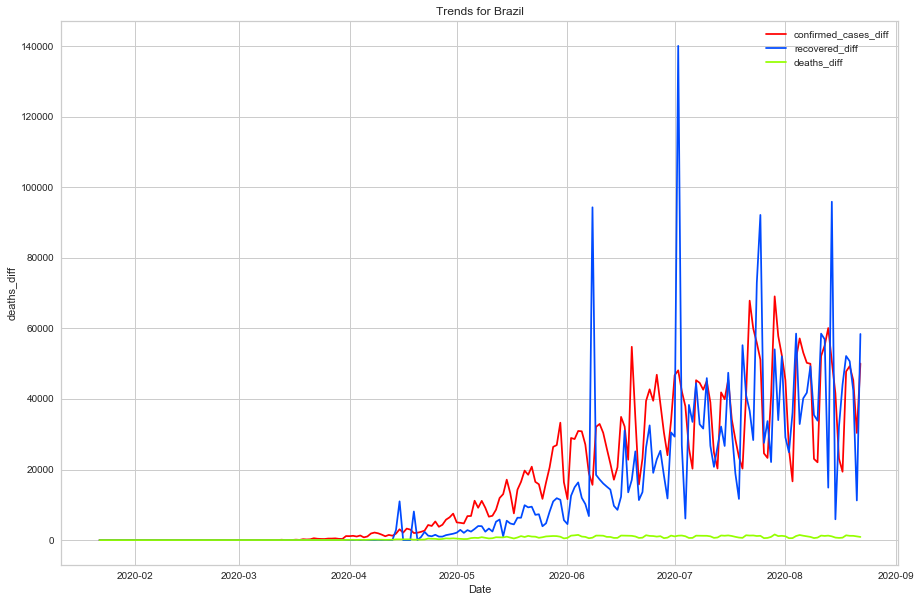

In [39]:
plot_columns(all_data_by_date_diffs, 
            'Brazil', 
            columns=['confirmed_cases_diff',
                     'recovered_diff',
                     'deaths_diff'])

In [41]:
def get_policy_counts(data):
    
    policy_counts_dict = defaultdict()
    policy_cols = list(filter(lambda x: 'OxBSG' in x, list(data.columns)))
    
    data_one_hot = pd.get_dummies(data, columns=policy_cols)
    new_policy_cols = list(filter(lambda x: 'OxBSG' in x, list(data_one_hot.columns)))
    
    countries = data['Country/Region'].unique()
    
    for col in new_policy_cols + ['Country/Region']:
        policy_counts_dict[col] = []
        
        
    for country in countries:
        policy_counts_dict['Country/Region'].append(country)
        country_data = filter_by_country(data_one_hot, country=country)
        policy_counts = country_data[new_policy_cols].sum()
        for col in new_policy_cols:
            policy_counts_dict[col].append(policy_counts[col])
            
    
    return pd.DataFrame(policy_counts_dict)

In [42]:
policy_counts_data = get_policy_counts(all_data_by_date_diffs)
policy_counts_data

,Cancel public events (OxBSG)_0,Cancel public events (OxBSG)_1,Cancel public events (OxBSG)_2,Restrictions on gatherings (OxBSG)_0,Restrictions on gatherings (OxBSG)_1,Restrictions on gatherings (OxBSG)_2,Restrictions on gatherings (OxBSG)_3,Restrictions on gatherings (OxBSG)_4,Public information campaigns (OxBSG)_0,Public information campaigns (OxBSG)_1,...,International travel controls (OxBSG)_0,International travel controls (OxBSG)_1,International travel controls (OxBSG)_2,International travel controls (OxBSG)_3,International travel controls (OxBSG)_4,Testing policy (OxBSG)_0,Testing policy (OxBSG)_1,Testing policy (OxBSG)_2,Testing policy (OxBSG)_3,Country/Region
0,39,3,167,74,0,0,0,135,39,0,...,32,70,0,107,0,32,177,0,0,Afghanistan
1,47,0,161,47,0,40,0,121,23,25,...,34,15,60,29,70,46,127,35,0,Albania
2,48,3,158,71,0,0,94,44,43,40,...,50,2,0,3,154,60,149,0,0,Algeria
3,51,144,14,167,0,0,42,0,84,27,...,77,0,79,53,0,40,47,42,80,Andorra
4,65,0,147,62,0,3,62,85,62,54,...,15,0,24,19,154,35,35,142,0,Angola
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,17,41,151,64,0,6,112,27,7,0,...,3,5,2,90,109,5,22,62,120,Vietnam
163,43,0,164,43,0,17,82,65,31,12,...,43,0,19,0,145,44,163,0,0,West Bank and Gaza
164,93,0,118,211,0,0,0,0,59,152,...,56,0,0,0,155,211,0,0,0,Yemen
165,132,56,23,64,0,0,124,23,30,0,...,30,0,145,0,36,56,155,0,0,Zambia


## Analysis

## What measures are most effective at slowing the spread of COVID-19?

### Creating Country Profiles

In [46]:
def create_country_profiles(data, drop_cols):
    

    last_date = data['Date'].max()
    latest_data = data[data['Date'] == last_date]
    policy_counts_data = get_policy_counts(data)
    original_policy_cols = list(filter(lambda x: 'OxBSG' in x, list(latest_data.columns)))
    latest_data.drop(policy_cols, axis=1, inplace=True)
    
    country_profiles = pd.merge(latest_data, policy_counts_data, 
         how='inner', 
         on=['Country/Region'])
    
    country_profiles.drop(drop_cols, axis=1, inplace=True)
    
    return country_profiles  

In [47]:
drop_cols = ['total_cases', 'new_cases', 'new_cases_smoothed',
             'new_deaths_smoothed', 'new_deaths_smoothed_per_million',
             'total_deaths', 'new_tests_smoothed_per_thousand',
             'new_tests_smoothed', 'date', 'iso_code', 'new_tests',
             'new_deaths', 'tests_per_case', 'new_cases_smoothed_per_million', 'new_deaths_per_million']

country_profiles = create_country_profiles(all_data_by_date_diffs, drop_cols)

In [48]:
country_profiles = pd.get_dummies(country_profiles, columns=['tests_units'])

### Training XGBoost Model to Gauge Feature Importance

In [49]:
from xgboost import XGBRegressor, plot_importance
xgb = XGBRegressor(n_estimators=50)

### Confirmed Cases as Target Variable

In [50]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code', 
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['confirmed_cases']

In [51]:
xgb.fit(X, y)

[11:43:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=50,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

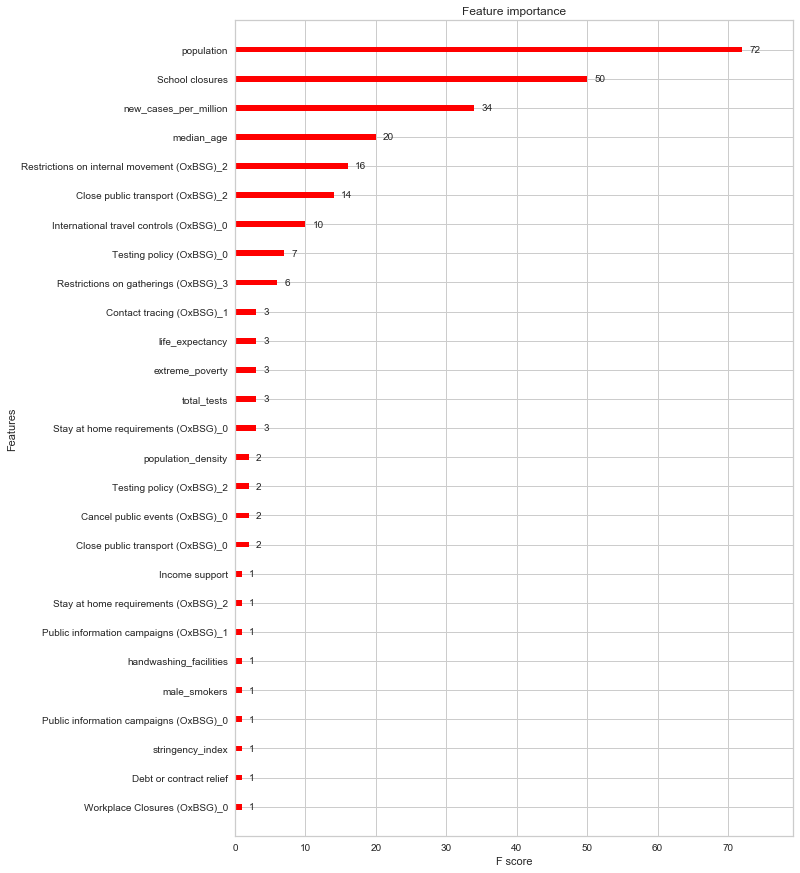

In [52]:
fig, ax = plt.subplots(figsize=(10, 15))
plot_importance(xgb, max_num_features=30, ax=ax)

In [53]:
def build_importance_plot(X, y):
    
    xgb = XGBRegressor(n_estimators=50)
    xgb.fit(X, y)
    
    fig, ax = plt.subplots(figsize=(10, 15))
    plot_importance(xgb, max_num_features=30, ax=ax)

### Deaths as Target Variable

[11:43:08] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


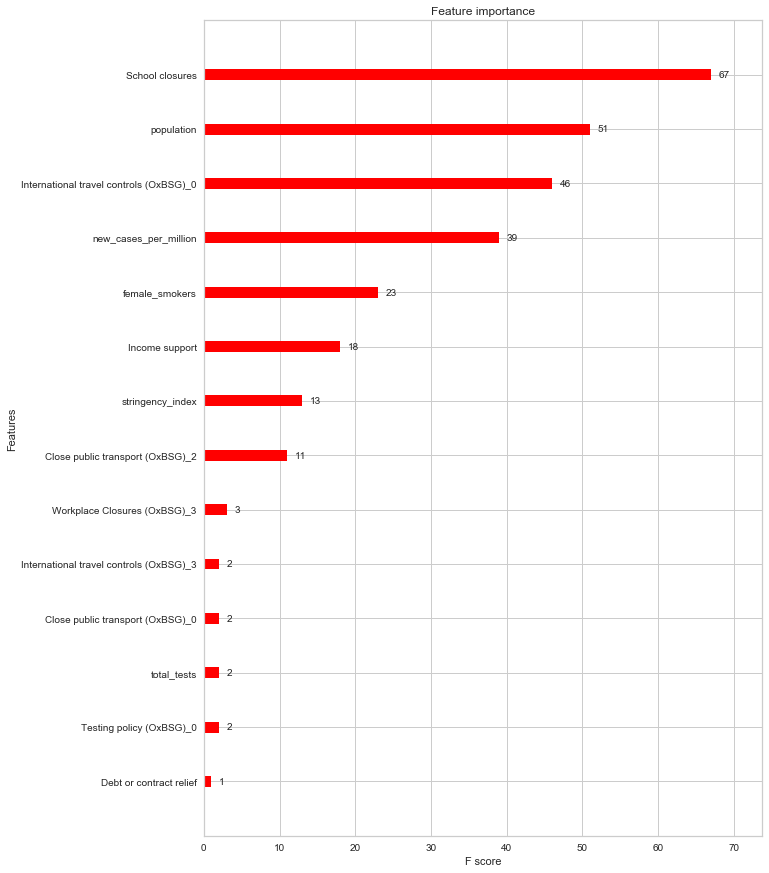

In [54]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code', 
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['deaths']

build_importance_plot(X, y)

### Recovered Cases as Target Variable

[11:43:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


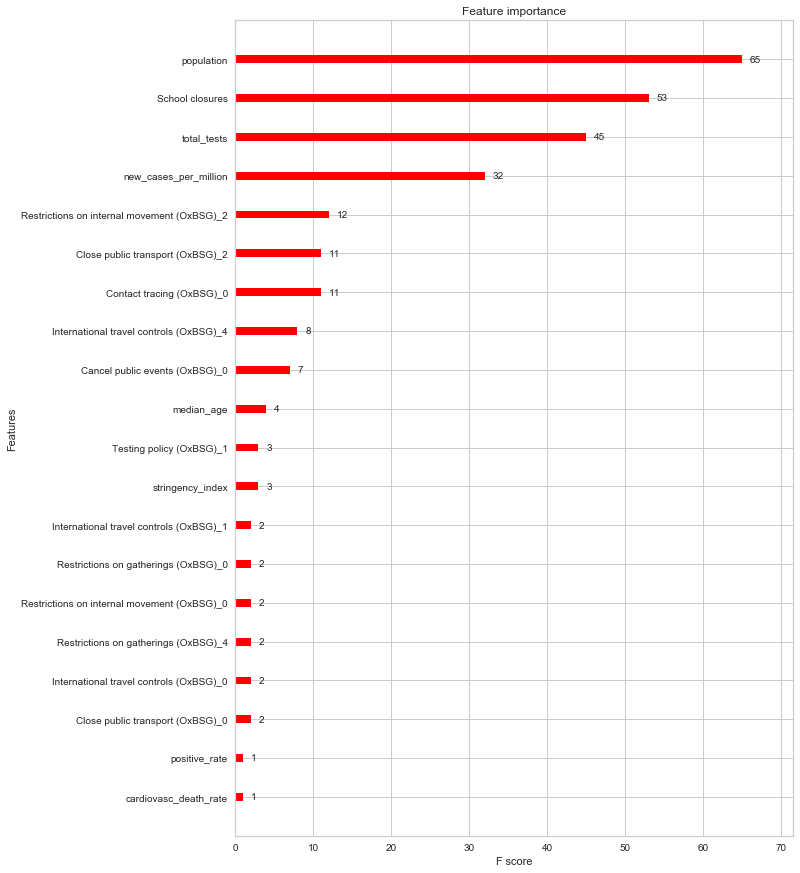

In [55]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code',
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['recovered']

build_importance_plot(X, y)

### Total Cases Per Million as Target

[11:43:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


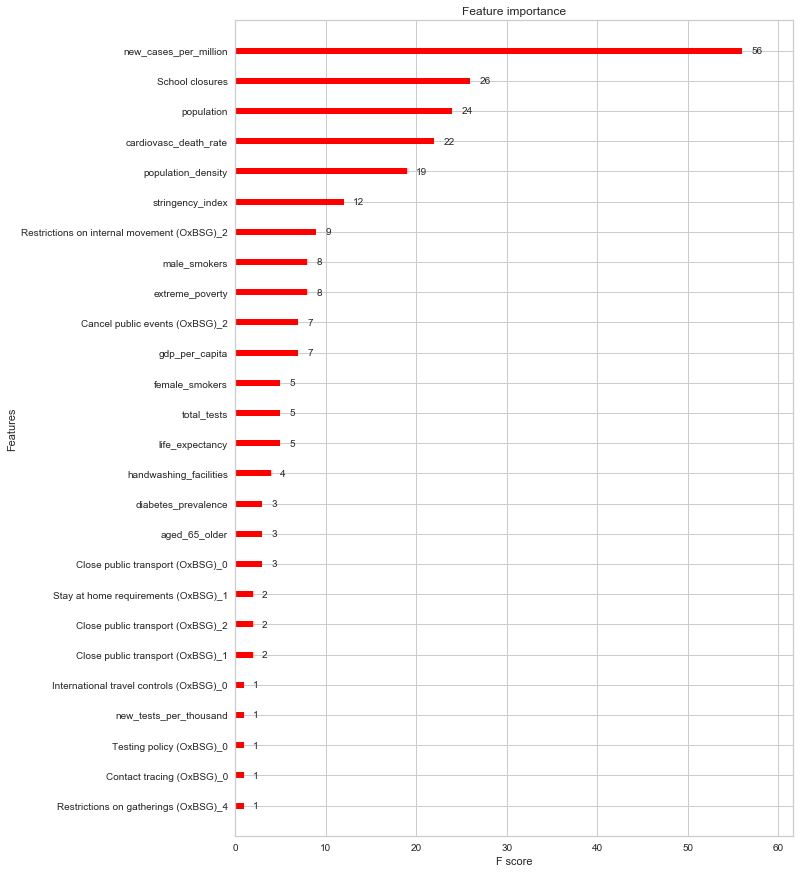

In [56]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code',
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million', 
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['total_cases_per_million']

build_importance_plot(X, y)

### Total Deaths Per Million as Target

[11:43:09] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


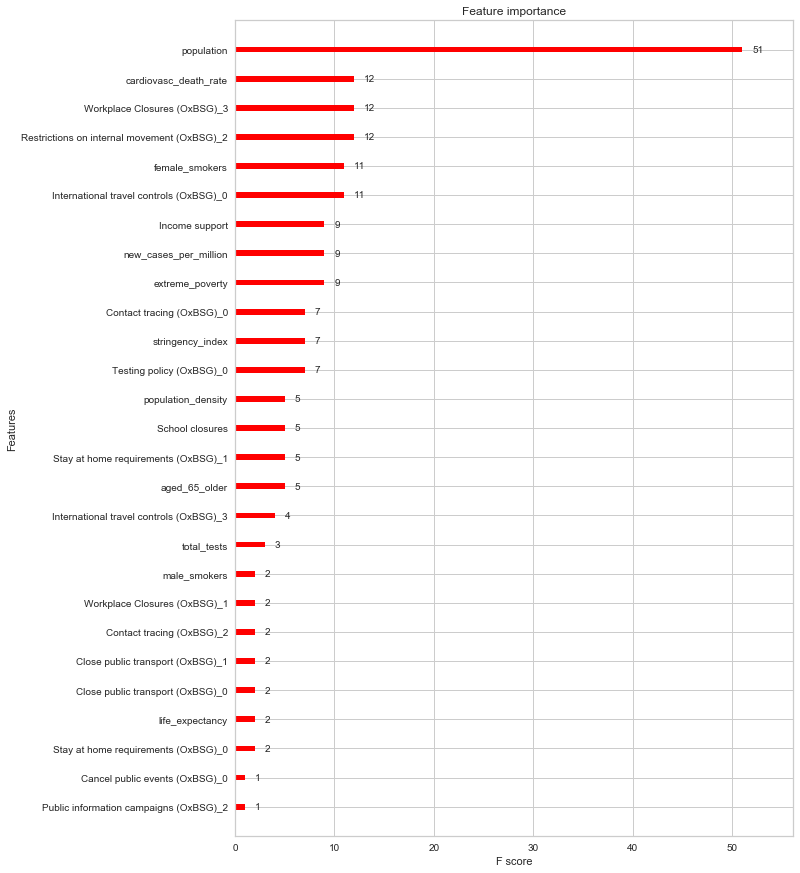

In [57]:
X = country_profiles.drop(['confirmed_cases_diff', 'deaths_diff', 'Code',
                          'recovered_diff', 'deaths', 'recovered', 'confirmed_cases',
                           'total_deaths_per_million', 'total_cases_per_million',
                          'continent', 'location', 'Country/Region', 'Date', 'Lat', 'Long'], axis=1)

y = country_profiles['total_deaths_per_million']

build_importance_plot(X, y)

## Forecasting COVID-19 Cases, Deaths and Recoveries, on a Daily Basis

In [58]:
def create_timeseries_dataset(data, targets):
    
    n = len(data)
    X = data.iloc[0:n-1]
    y = data.iloc[1:n][targets]
    
    return X, y

def compute_cumulative_statistics(data, targets):
    
    for target in targets:
        data[target + '_cum_median'] = data[target].expanding().median()
        data[target + '_cum_mean'] = data[target].expanding().mean()
        data[target + '_cum_var'] = data[target].expanding().var()
        data[target + '_cum_max'] = data[target].cummax()
        
    return data

def create_timeseries_dataset_all_countries(data, targets):
    
    countries = list(data['Country/Region'].unique())
    
    X_data = []
    y_data = []
    
    for country in countries:
        country_data = compute_cumulative_statistics(filter_by_country(data, country), targets)
        X_i, y_i = create_timeseries_dataset(country_data, targets)
        X_data.append(X_i)
        y_data.append(y_i)
    
    X = pd.concat(X_data, axis=0)
    y = np.concatenate(y_data)
    
   # X.rename({target: 'current_' + target}, inplace=True)
    
    return X, y

def train_test_split_by_date(X, y, start_date, cutoff_date, targets=['confirmed_cases_diff', 'deaths_diff', 'recovered_diff']):
    
    targets = [target + '_next' for target in targets]
    data = X
    for index, target in enumerate(targets):
        data[target] = y[:, index]
    train = data[(data['Date'] >= start_date) & (data['Date'] <= cutoff_date)]
    test = data[data['Date'] > cutoff_date]
    
    X_train, y_train = train.drop(targets +  ['Date'], axis=1), train[targets]
    X_test, y_test = test.drop(targets + ['Date'], axis=1), test[targets]
    
    return X_train, X_test, y_train, y_test

## Forecasting Cases

### Preparing the Data

In [59]:
drop_cols = ['Code', 'new_cases','new_deaths', 'total_cases_per_million',
                          'new_cases_per_million', 'total_deaths_per_million', 'total_deaths',
                          'new_deaths_per_million', 'total_cases', 'new_cases', 'new_tests_smoothed',
                          'new_tests', 'total_tests', 'total_tests_per_thousand', 'new_tests_smoothed_per_thousand',
                          'new_tests_per_thousand', 'tests_per_case', 'positive_rate',
                          'continent', 'location', 'iso_code', 'date', 'tests_units']

data_for_timeseries = all_data_by_date_diffs.drop(drop_cols, axis=1)


X, y = create_timeseries_dataset_all_countries(data_for_timeseries, 
                                               targets=['confirmed_cases_diff', 'deaths_diff', 'recovered_diff'])
X.drop('Country/Region', axis=1, inplace=True)
policy_cols = list(filter(lambda x: 'OxBSG' in x, list(X.columns))) + ['School closures', 
                                                                           'Debt or contract relief',
                                                                           'Income support']


In [60]:
from sklearn.model_selection import train_test_split, cross_validate, KFold
from sklearn.metrics import r2_score, mean_squared_error
train_data = defaultdict()

start_date = datetime(2020, 1, 1)
cutoff_date = datetime(2020, 7, 15)
X_train, X_test, y_train, y_test = train_test_split_by_date(X, y, start_date, cutoff_date)
train_data['X_train'], train_data['X_val'], train_data['y_train'], train_data['y_val'] = train_test_split(X_train,
                                                                                                          y_train,
                                                                                                          test_size=0.2)

In [61]:
from sklearn.metrics import r2_score, mean_absolute_error

def mean_absolute_percentage_error(y_pred, y_true):
    
    n = len(y_pred)
    percentage_errors = np.abs(y_pred - y_true) / np.abs(y_true)
    mape = np.average(percentage_errors, dtype=np.float64)
    return mape

def evaluate_model(model, X_test, y_test):
    
    pred = model.predict(X_test)
    print('R2 = {}'.format(r2_score(y_test, pred)))
    print('MAE = {}'.format(mean_absolute_error(y_test, pred)))
    print('Average Predicted Confirmed Cases = {}'.format(np.mean(pred)))
    print('Average Actual Confirmed Cases = {}'.format(np.mean(y_test)))
    
    return pred
    

def evaluate_model_multi_target(model, X_test, y_test):
    
    pred = model.predict(X_test)
    print('Overall R2 = {}'.format(r2_score(y_test, pred)))
    print('MAE = {}'.format(mean_absolute_error(y_test, pred)))
    print('Average Predicted Confirmed Cases = {}'.format(np.mean(pred[:, 0])))
    print('Average Actual Confirmed Cases = {}'.format(np.mean(y_test.values[:, 0])))
    print('R2 for Confirmed Cases = {}'.format(r2_score(pred[:, 0], y_test.values[:, 0])))
    print('Average Predicted Deaths = {}'.format(np.mean(pred[:, 1])))
    print('Average Actual Deaths = {}'.format(np.mean(y_test.values[:, 1])))
    print('R2 for Deaths = {}'.format(r2_score(pred[:, 1], y_test.values[:, 1])))
    print('Average Predicted Recovered = {}'.format(np.mean(pred[:, 2])))
    print('Average Actual Recovered  = {}'.format(np.mean(y_test.values[:, 2])))
    print('R2 for Recovered = {}'.format(r2_score(pred[:, 2], y_test.values[:, 2])))
    #print('MAPE w/o zeros = {} %'.format(100*mean_absolute_percentage_error(pred, y_test)))
    return pred

In [62]:
def plot_residuals(pred, y_test):
    
    residuals = pred - y_test
    residual_df = pd.DataFrame({'residuals': residuals, 'predicted_values': pred})
    sns.jointplot(x='predicted_values', y='residuals', data=residual_df, height=10)

def plot_residuals_multi_target(pred, y_test, index):
    
    residuals = pred[:, index] - y_test.values[:, index]
    residual_df = pd.DataFrame({'residuals': residuals, 'predicted_values': pred[:, index]})
    sns.jointplot(x='predicted_values', y='residuals', data=residual_df, height=10)

### Writing a Custom Data Cleaning Transformer

In [63]:
from sklearn.preprocessing import FunctionTransformer, StandardScaler
from sklearn.impute import SimpleImputer

def clean_data(X):
    
    policy_cols = list(filter(lambda x: 'OxBSG' in x, list(X.columns))) + ['School closures', 
                                                                           'Debt or contract relief',
                                                                           'Income support']
    X_one_hot = pd.get_dummies(X, columns=policy_cols)
    imputer = SimpleImputer(strategy='median')
    X_imputed = imputer.fit_transform(X_one_hot)
    
    return X_imputed

data_cleaner = FunctionTransformer(clean_data)

In [64]:
from sklearn.preprocessing import OneHotEncoder    
from sklearn.base import BaseEstimator, TransformerMixin


class CustomOneHotEncoder(BaseEstimator, TransformerMixin):
    
    def __init__(self, encode_cols):
        
        self.encode_cols = encode_cols
        self.col_mapping_dict = defaultdict()
        self.one_hot_cols = defaultdict()
        

    def fit(self, X, y=None):
        
        for col in self.encode_cols:
            unique_values = list(X[col].unique())
            self.col_mapping_dict[col] = unique_values
            self.one_hot_cols[col] = []
            for value in unique_values:
                self.one_hot_cols[col] = self.one_hot_cols[col] + [col + '_' + str(value)]
        
        return self
        
    
    def _one_hot_encode(self, target, value):
        
        return int(target == value);
    
    def transform(self, X):
        
        X_copy = X
        for col in self.encode_cols:
            #print('Working on ', col)
            targets = self.col_mapping_dict[col]
            for target in targets:
                one_hot_col = col + '_' + str(target)
                X_copy[one_hot_col] = X_copy[col].map(lambda x: self._one_hot_encode(target, x))
        
        return X_copy.drop(self.encode_cols, axis=1)
            
        

def make_categorical(data, cat_cols):
    
    for col in cat_cols:
        data[col] = data[col].astype('category')
    
    return data

## Using LASSO

### Predicting Cases

In [65]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LassoLarsCV

lasso_pipeline_cases = Pipeline([('encoder', CustomOneHotEncoder(encode_cols=policy_cols)),
                                      ('imputer', SimpleImputer(strategy='median')),
                                      ('scaler', StandardScaler()),
                                      ('lasso', LassoLarsCV())], verbose=True)

lasso_pipeline_cases.fit(X_train, y_train['confirmed_cases_diff_next'])

[Pipeline] ........... (step 1 of 4) Processing encoder, total=   1.1s
[Pipeline] ........... (step 2 of 4) Processing imputer, total=   0.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.0s
[Pipeline] ............. (step 4 of 4) Processing lasso, total=   0.8s


Pipeline(memory=None,
         steps=[('encoder',
                 CustomOneHotEncoder(encode_cols=['Cancel public events '
                                                  '(OxBSG)',
                                                  'Restrictions on gatherings '
                                                  '(OxBSG)',
                                                  'Public information '
                                                  'campaigns (OxBSG)',
                                                  'Close public transport '
                                                  '(OxBSG)',
                                                  'Workplace Closures (OxBSG)',
                                                  'Stay at home requirements '
                                                  '(OxBSG)',
                                                  'Contact tracing (OxBSG)',
                                                  'Restrictions on internal '
                   

In [66]:
pred = evaluate_model(lasso_pipeline_cases, X_test, y_test['confirmed_cases_diff_next'])

R2 = 0.9534766585046055
MAE = 380.6618905606505
Average Predicted Confirmed Cases = 1613.6138938899567
Average Actual Confirmed Cases = 1588.8857664233576


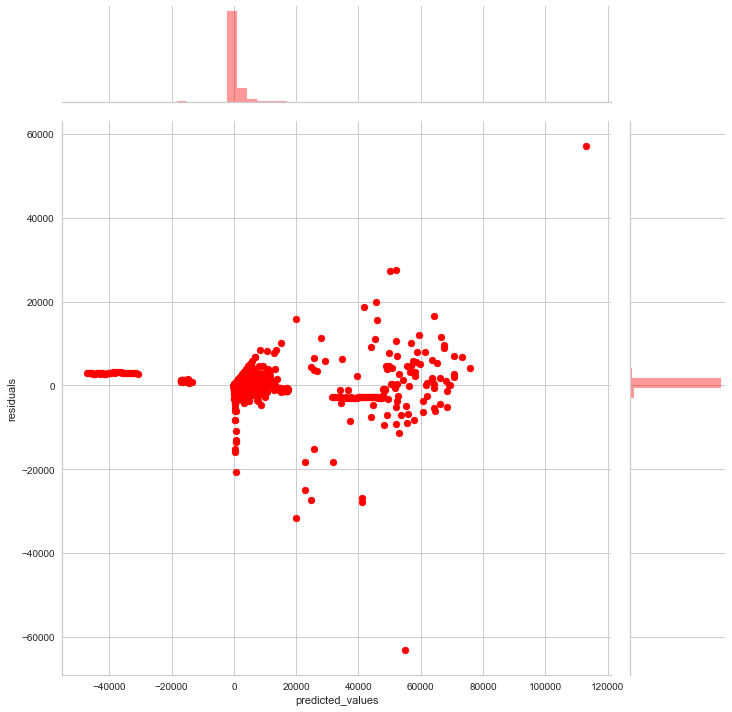

In [67]:
plot_residuals(pred, y_test['confirmed_cases_diff_next'])

In [68]:
dump(lasso_pipeline_cases, './models/lasso_pipeline_cases.joblib')

['./models/lasso_pipeline_cases.joblib']

### Predicting Deaths

In [69]:
lasso_pipeline_deaths = Pipeline([('encoder', CustomOneHotEncoder(encode_cols=policy_cols)),
                                      ('imputer', SimpleImputer(strategy='median')),
                                      ('scaler', StandardScaler()),
                                      ('lasso', LassoLarsCV())], verbose=True)

lasso_pipeline_deaths.fit(X_train, y_train['deaths_diff_next'])

[Pipeline] ........... (step 1 of 4) Processing encoder, total=   1.1s
[Pipeline] ........... (step 2 of 4) Processing imputer, total=   0.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.0s
[Pipeline] ............. (step 4 of 4) Processing lasso, total=   0.6s


Pipeline(memory=None,
         steps=[('encoder',
                 CustomOneHotEncoder(encode_cols=['Cancel public events '
                                                  '(OxBSG)',
                                                  'Restrictions on gatherings '
                                                  '(OxBSG)',
                                                  'Public information '
                                                  'campaigns (OxBSG)',
                                                  'Close public transport '
                                                  '(OxBSG)',
                                                  'Workplace Closures (OxBSG)',
                                                  'Stay at home requirements '
                                                  '(OxBSG)',
                                                  'Contact tracing (OxBSG)',
                                                  'Restrictions on internal '
                   

In [70]:
pred = evaluate_model(lasso_pipeline_deaths, X_test, y_test['deaths_diff_next'])

R2 = 0.8199821847761622
MAE = 14.495066932079604
Average Predicted Confirmed Cases = 35.4655385817049
Average Actual Confirmed Cases = 35.82700729927007


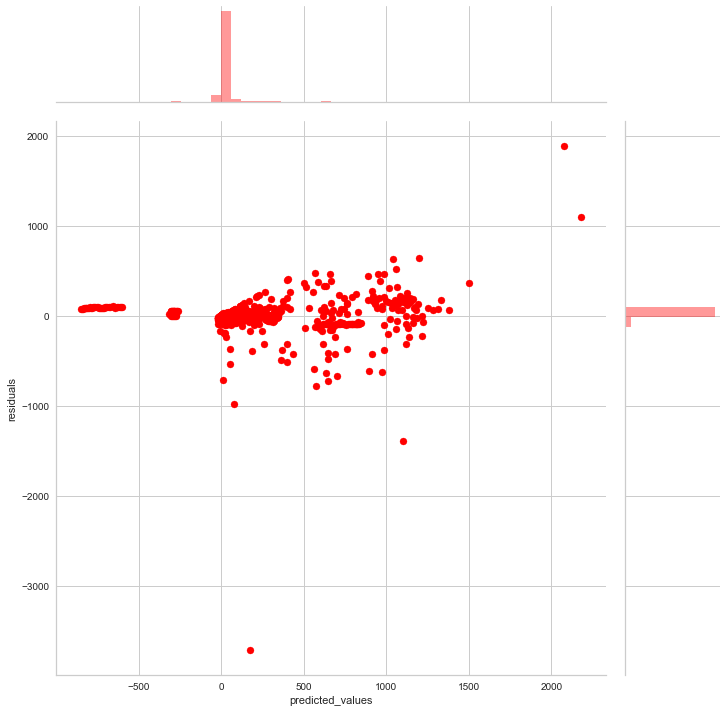

In [71]:
plot_residuals(pred, y_test['deaths_diff_next'])

In [72]:
dump(lasso_pipeline_deaths, './models/lasso_pipeline_deaths.joblib')

['./models/lasso_pipeline_deaths.joblib']

### Predicting Recovered Cases

In [73]:
lasso_pipeline_recovered = Pipeline([('encoder', CustomOneHotEncoder(encode_cols=policy_cols)),
                                      ('imputer', SimpleImputer(strategy='median')),
                                      ('scaler', StandardScaler()),
                                      ('lasso', LassoLarsCV())], verbose=True)

lasso_pipeline_recovered.fit(X_train, y_train['recovered_diff_next'])

[Pipeline] ........... (step 1 of 4) Processing encoder, total=   1.1s
[Pipeline] ........... (step 2 of 4) Processing imputer, total=   0.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
[Pipeline] ............. (step 4 of 4) Processing lasso, total=   0.8s


Pipeline(memory=None,
         steps=[('encoder',
                 CustomOneHotEncoder(encode_cols=['Cancel public events '
                                                  '(OxBSG)',
                                                  'Restrictions on gatherings '
                                                  '(OxBSG)',
                                                  'Public information '
                                                  'campaigns (OxBSG)',
                                                  'Close public transport '
                                                  '(OxBSG)',
                                                  'Workplace Closures (OxBSG)',
                                                  'Stay at home requirements '
                                                  '(OxBSG)',
                                                  'Contact tracing (OxBSG)',
                                                  'Restrictions on internal '
                   

In [74]:
pred = evaluate_model(lasso_pipeline_recovered, X_test, y_test['recovered_diff_next'])

R2 = 0.7652242061747068
MAE = 799.0978434347828
Average Predicted Confirmed Cases = 1145.0629677615714
Average Actual Confirmed Cases = 1220.0485401459855


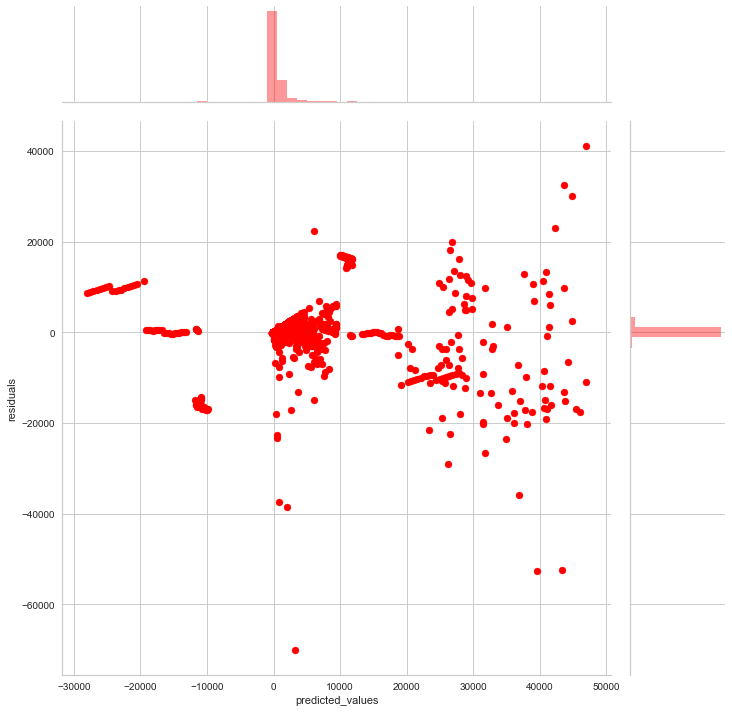

In [75]:
plot_residuals(pred, y_test['recovered_diff_next'])

In [76]:
dump(lasso_pipeline_recovered, './models/lasso_pipeline_recovered.joblib')

['./models/lasso_pipeline_recovered.joblib']

### Predicting all three fields at once

In [77]:
from sklearn.multioutput import MultiOutputRegressor

lasso_pipeline = Pipeline([('encoder', CustomOneHotEncoder(encode_cols=policy_cols)),
                                      ('imputer', SimpleImputer(strategy='median')),
                                      ('scaler', StandardScaler()),
                                      ('lasso', MultiOutputRegressor(LassoLarsCV()))], verbose=True)

lasso_pipeline.fit(X_train, y_train)

[Pipeline] ........... (step 1 of 4) Processing encoder, total=   1.1s
[Pipeline] ........... (step 2 of 4) Processing imputer, total=   0.3s
[Pipeline] ............ (step 3 of 4) Processing scaler, total=   0.1s
[Pipeline] ............. (step 4 of 4) Processing lasso, total=   2.2s


Pipeline(memory=None,
         steps=[('encoder',
                 CustomOneHotEncoder(encode_cols=['Cancel public events '
                                                  '(OxBSG)',
                                                  'Restrictions on gatherings '
                                                  '(OxBSG)',
                                                  'Public information '
                                                  'campaigns (OxBSG)',
                                                  'Close public transport '
                                                  '(OxBSG)',
                                                  'Workplace Closures (OxBSG)',
                                                  'Stay at home requirements '
                                                  '(OxBSG)',
                                                  'Contact tracing (OxBSG)',
                                                  'Restrictions on internal '
                   

In [78]:
pred = evaluate_model_multi_target(lasso_pipeline, X_test, y_test)

Overall R2 = 0.8462276831518247
MAE = 398.08493364250427
Average Predicted Confirmed Cases = 1613.6138938899567
Average Actual Confirmed Cases = 1588.8857664233576
R2 for Confirmed Cases = 0.9513720027743326
Average Predicted Deaths = 35.4655385817049
Average Actual Deaths = 35.82700729927007
R2 for Deaths = 0.7941448125508017
Average Predicted Recovered = 1145.0629677615714
Average Actual Recovered  = 1220.0485401459855
R2 for Recovered = 0.6382667757852332


In [79]:
dump(lasso_pipeline, './models/lasso_pipeline.joblib')

['./models/lasso_pipeline.joblib']

## Generating and Visualizing Daily Forecasts for COVID-19 in Different Countries

### Loading Models and Defining Utility Functions

In [80]:
cases_model = load('./models/lasso_pipeline_cases.joblib')
deaths_model = load('./models/lasso_pipeline_deaths.joblib')
recovered_model = load('./models/lasso_pipeline_recovered.joblib')

In [167]:
from datetime import timedelta

drop_cols = ['Code', 'new_cases','new_deaths', 'total_cases_per_million',
                          'new_cases_per_million', 'total_deaths_per_million', 'total_deaths',
                          'new_deaths_per_million', 'total_cases', 'new_cases', 'new_tests_smoothed',
                          'new_tests', 'total_tests', 'total_tests_per_thousand', 'new_tests_smoothed_per_thousand',
                          'new_tests_per_thousand', 'tests_per_case', 'positive_rate', 'date',
                          'continent', 'location', 'iso_code', 'Date', 'tests_units', 'Country/Region']

stringency_index_cols = ['Cancel public events (OxBSG)', 'Restrictions on gatherings (OxBSG)',
                         'Public information campaigns (OxBSG)', 'Workplace Closures (OxBSG)',
                         'Stay at home requirements (OxBSG)', 'Restrictions on internal movement (OxBSG)',
                         'International travel controls (OxBSG)', 'Testing policy (OxBSG)',
                         'School closures']

def set_policy_cols(data, policy_dict):
    
    if policy_dict is None:
        
        return data
    
    else:
        
        for col, value in policy_dict.items():
            data[col] = data[col].map(lambda x: value)
    
        return data
    
def days_to_predict(data, country, future_date):
    
    country_data = filter_by_country(data, country=country)
    latest_date = country_data['Date'].max()
    
    time_diff = future_date - latest_date
    
    return time_diff.days
    

def create_max_value_dict(data, policy_cols):
    
    data_dict = defaultdict()
    
    for col in policy_cols:
        data_dict[col] = data[col].max()
    
    return data_dict

max_value_dict = create_max_value_dict(all_data_by_date_diffs, policy_cols)

def normalize(policy_col, value, max_value_dict):
    
    return 100.0 * (value / max_value_dict[policy_col])

def calculate_stringency_index(data, policy_cols):
    
    normalized_scores = []
    for col in policy_cols:
        normalized_scores.append(normalize(col, data[col].values[-1], max_value_dict))
    
    return np.mean(np.array(normalized_scores))

def get_latest_data(data, country):
    
    country_data = filter_by_country(data, country=country)
    latest_date = country_data['Date'].max()
    latest_data = country_data[country_data['Date'] == latest_date]
    
    return latest_data
            

def predict_future(data, country, future_date, drop_cols, policy_dict):
    
    country_data = filter_by_country(data, country=country)
    forecast_results = pd.DataFrame()
    
    n_days = days_to_predict(data, country, future_date)
    
    for i in range(n_days):
        country_data_stats = compute_cumulative_statistics(country_data, 
                                                 targets=['confirmed_cases_diff',
                                                          'deaths_diff',
                                                          'recovered_diff'])
        if i == 0:
            latest_date = country_data_stats['Date'].max()
            latest_data = country_data_stats[country_data['Date'] == latest_date]
            new_date = latest_date + timedelta(days=1)
        else:
            latest_date = forecast_results['Date'].max()
            latest_data = country_data_stats[country_data_stats['Date'] == latest_date]
            new_date = latest_date + timedelta(days=1)  
        
        latest_data = set_policy_cols(latest_data, policy_dict)
        cases_diff = cases_model.predict(latest_data.drop(drop_cols, axis=1))
        deaths_diff = deaths_model.predict(latest_data.drop(drop_cols, axis=1))
        recovered_diff = recovered_model.predict(latest_data.drop(drop_cols, axis=1))
        cases_pred = cases_diff + latest_data['confirmed_cases']
        deaths_pred = deaths_diff + latest_data['deaths']
        recovered_pred = recovered_diff + latest_data['recovered']
        stringency_index = calculate_stringency_index(latest_data, stringency_index_cols)
        
        #print(latest_data.info())
        forecast_data = set_policy_cols(latest_data, policy_dict)
        forecast_data['confirmed_cases'] = cases_pred
        forecast_data['deaths'] = deaths_pred
        forecast_data['recovered'] = recovered_pred
        forecast_data['confirmed_cases_diff'] = cases_diff
        forecast_data['deaths_diff'] = deaths_diff
        forecast_data['recovered_diff'] = recovered_diff
        forecast_data['stringency_index'] = stringency_index
        forecast_data['Date'] = [new_date]
        country_data = country_data.append(forecast_data)
        
        forecast_results = forecast_results.append(forecast_data)
    
    return forecast_results

def plot_forecast(forecast_results, country, columns):
    
    plt.figure(figsize=(15, 10))
    for column in columns:
        plt.plot(forecast_results['Date'], forecast_results[column], label=column)
    plt.xlabel('Date')
    plt.ylabel('Statistics')
    plt.legend(loc='best')
    plt.title('Forecast for {}'.format(country))
    plt.show()

default_columns = ['confirmed_cases', 'deaths', 'recovered']

### Forecasts for the US

In [194]:
future_date = datetime(2020, 10, 26)
start_date = datetime(2020, 8, 26)

In [195]:
us_predictions = predict_future(all_data_by_date_diffs, 
                                    'US', future_date=future_date, 
                                    drop_cols=drop_cols, policy_dict=None)

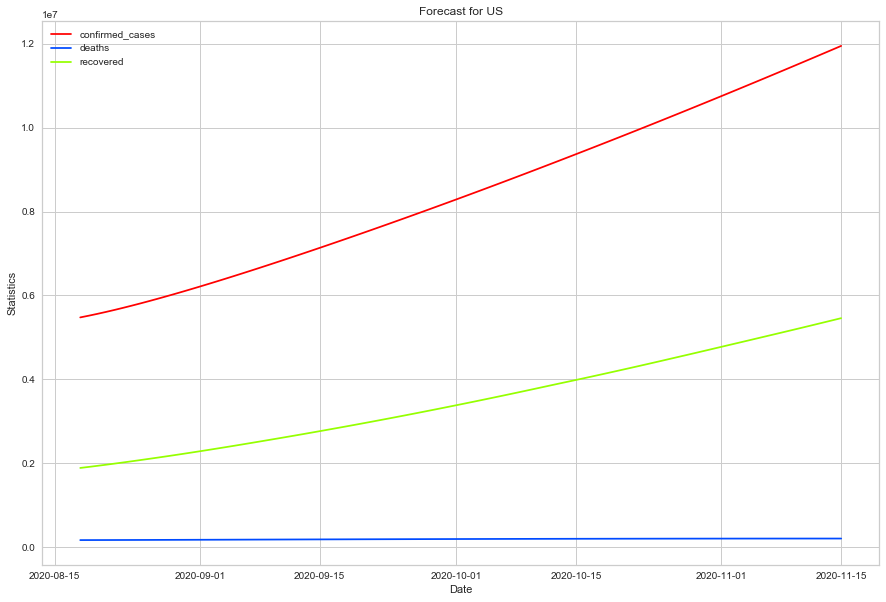

In [196]:
plot_forecast(us_predictions, country='US', columns=default_columns)

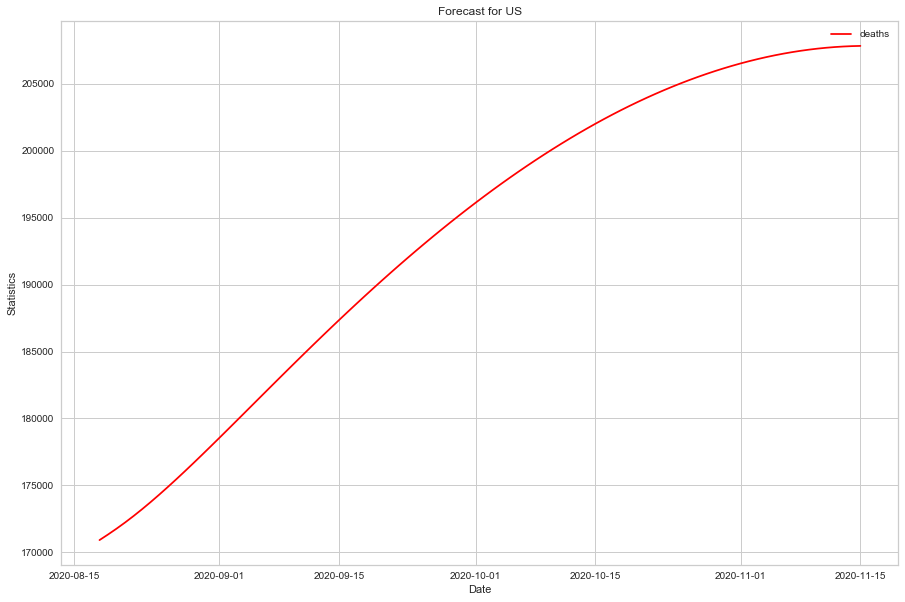

In [201]:
plot_forecast(us_predictions, country='US', columns=['deaths'])

### Predictions for All Countries

In [197]:
predictions_dict = defaultdict()
all_countries = list(all_data_by_date_diffs['Country/Region'].unique())

pbar = pyprind.ProgBar(len(all_countries), title='Generating World COVID Forecasts')

for country in all_countries:
    predictions_dict[country] = predict_future(all_data_by_date_diffs, 
                                    country, future_date=future_date, 
                                    drop_cols=drop_cols, policy_dict=None)
    pbar.update()

Generating World COVID Forecasts
0% [##############################] 100% | ETA: 00:00:00
Total time elapsed: 00:29:42


In [198]:
def create_future_df(predictions_dict):
    
    
    return pd.concat(list(predictions_dict.values()))


forecast_df = create_future_df(predictions_dict)
forecast_df['Date'] = pd.to_datetime(forecast_df['Date'])
forecast_df_same_start = forecast_df[forecast_df['Date'] >= start_date]
forecast_df_same_start['Date'] = forecast_df_same_start['Date'].map(lambda x: str(x))

### Visualizing the Future of COVID-19

In [200]:
fig = px.choropleth(forecast_df_same_start, 
                    animation_frame = 'Date',
                    locations = 'Country/Region', 
                    locationmode = 'country names',
                    color_continuous_scale = "matter",
                    color = 'confirmed_cases',
                    range_color=(0,1.5e7),
                    title='COVID-19 Forecasts')

fig.show()